This notebook opens the MUSE files and plots them "Figures/AllMUSEGalaxies.png".
This notebook also writes the MUSE galaxies and their filenames in ../Data/MUSEdata.csv

In [1]:
import matplotlib.pyplot as plt
from astropy.io import fits
import astropy.io.fits as pyfits
import sys, os
from astropy.wcs import WCS
# !{sys.executable} -m pip install aplpy
import numpy as np
import aplpy
from astropy.table import Table

In [2]:
PHANGS_table = Table.read("../Data/0.phangs_v1p6.csv")

# Anand 2021
# distances = [9.0,12.2,9.8,10.0,15.9,11.3,19.0,13.1,19.6,17.0,17.2,15.2,18.6,15.8,18.8,5.2,17.7,18.7,19.4]
#emsellem22
physRes = [45,42,71,62,84,96,83,96,76,73,33,43,69,61,96,59,80,23,104]
# PHANGS_table.columns

PHANGS_table[0:1]

galaxy,pgc,alias,survey_astrosat_status,survey_astrosat_instrument,survey_astrosat_notes,survey_astrosat_references,survey_galex_status,survey_galex_instrument,survey_galex_notes,survey_galex_references,survey_halpha_status,survey_halpha_instrument,survey_halpha_notes,survey_halpha_references,survey_muse_status,survey_muse_instrument,survey_muse_notes,survey_muse_references,survey_kcwi_status,survey_kcwi_instrument,survey_kcwi_notes,survey_kcwi_references,survey_sitelle_status,survey_sitelle_instrument,survey_sitelle_notes,survey_sitelle_references,survey_typhoon_status,survey_typhoon_instrument,survey_typhoon_notes,survey_typhoon_references,survey_hst_status,survey_hst_instrument,survey_hst_notes,survey_hst_references,survey_irac_status,survey_irac_instrument,survey_irac_notes,survey_irac_references,survey_mips_status,survey_mips_instrument,survey_mips_notes,survey_mips_references,survey_wise_status,survey_wise_instrument,survey_wise_notes,survey_wise_references,survey_herschel_status,survey_herschel_instrument,survey_herschel_notes,survey_herschel_references,survey_alma_status,survey_alma_instrument,survey_alma_notes,survey_alma_references,survey_otherco_status,survey_otherco_instrument,survey_otherco_notes,survey_otherco_references,survey_hiresco_status,survey_hiresco_instrument,survey_hiresco_notes,survey_hiresco_references,survey_multijco_status,survey_multijco_instrument,survey_multijco_notes,survey_multijco_references,survey_dense_status,survey_dense_instrument,survey_dense_notes,survey_dense_references,survey_hi_status,survey_hi_instrument,survey_hi_notes,survey_hi_references,orient_ra,orient_ra_unc,orient_dec,orient_dec_unc,orient_pos_ref,orient_vlsr,orient_vlsr_unc,orient_vlsr_ref,orient_incl,orient_incl_unc,orient_posang,orient_posang_unc,orient_ref,rotcur_v0,rotcur_v0_unc,rotcur_rt,rotcur_rt_unc,rotcur_ref,dist,dist_unc,dist_label,dist_ref,size_r90,size_r90_unc,size_r90_ref,mwext_sfd98,mwext_sfd98_unc,mwext_sf11,mwext_sf11_unc,z0mgs_mtol,props_mtol_method,props_sfr,props_sfr_unc,props_sfr_method,props_mstar,props_mstar_unc,props_mtol,props_deltams,props_deltams_unc,props_mhi,props_mhi_unc,lco_phangs,lco_phangs_unc,appcor_phangs,aco10_phangs,size_r25,size_r25_unc,size_reff,size_reff_unc,size_scalelength,size_scalelength_unc,mh2_phangs,mh2_phangs_unc,morph_t,morph_t_unc,morph_string,morph_bar,morph_buta15,morph_class,morph_gold,morph_bar_flag,morph_bar_axis_ratio,morph_bar_pa,morph_bar_r,morph_bar_red,morph_bar_q_flag,morph_nuclear_bar_axis_ratio,morph_nuclear_bar_pa,morph_nuclear_bar_r,morph_spiral_arms,morph_multi_arm,morph_featureless,morph_disk_1_axis_ratio,morph_disk_1_pa,morph_disk_1_r,morph_disk_2_axis_ratio,morph_disk_2_pa,morph_disk_2_r,morph_bulge_axis_ratio,morph_bulge_pa,morph_bulge_r,morph_rings_outer,morph_ring_inner,morph_lens_1_axis_ratio,morph_lens_1_pa,morph_lens_1_r,morph_lens_2_axis_ratio,morph_lens_2_pa,morph_lens_2_r,morph_ring_1_axis_ratio,morph_ring_1_pa,morph_ring_1_r,morph_ring_2_axis_ratio,morph_ring_2_pa,morph_ring_2_r,morph_vcc,morph_interacting,morph_in_virgo_fornax,morph_high_peculiar,morph_comments,agn_veron_y_n,agn_veron_class,agn_milliquas_y_n,agn_milliquas_class_pQSO
str8,int64,str369,str21,int64,int64,int64,str18,str7,str6,str19,str21,str14,int64,int64,str13,int64,int64,int64,str21,int64,int64,int64,str21,str7,str10,int64,str21,str17,int64,int64,str21,int64,int64,int64,str13,int64,int64,int64,str13,int64,int64,int64,str13,str11,int64,str39,str13,int64,int64,int64,str21,str9,str33,str51,str21,str13,str19,str33,str21,str74,str109,str29,str21,str19,str31,int64,str21,str25,str68,str19,str21,str15,str19,str24,float64,float64,float64,float64,str19,float64,float64,str11,float64,float64,float64,float64,str36,float64,float64,float64,float64,str11,float64,float64,str9,str59,float64,float64,str16,float64,float64,float64,float64,float64,str8,float64,float64,str6,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float

In [3]:
# Organize MUSE galaxies and their information in MUSE table
# Filenames have following format:

galaxies = ["IC5332", "NGC2835", "NGC0628", "NGC3351", "NGC1087", "NGC3627", "NGC1300", "NGC4254", "NGC1365",
            "NGC4303", "NGC1385", "NGC4321", "NGC1433", "NGC4535", "NGC1512", "NGC5068", "NGC1566", "NGC7496",
            "NGC1672"]

natRes = ["0.87", "1.15", "0.92", "1.05", "0.92", "1.05", "0.89", "0.89", "1.15", "0.78", "0.77", "1.16",
          "0.91", "0.56", "1.25", "1.04", "0.80", "0.89", "0.96"]

dists, pas, ras, decs, incls, reff = [],[],[],[],[],[]

for i in range(len(galaxies)):
    for j in range(len(PHANGS_table)):
        if galaxies[i] == PHANGS_table["galaxy"][j].upper():
            dists.append(PHANGS_table["dist"][j])
            pas.append(PHANGS_table["orient_posang"][j])
            ras.append(PHANGS_table["orient_ra"][j])
            decs.append(PHANGS_table["orient_dec"][j])
            incls.append(PHANGS_table["orient_incl"][j])
            reff.append(PHANGS_table["size_reff"][j])
            
    
maps_musedap, maps_nat, maps_15asec, maps_150, maps_1kpc, maps_HII, maps_irac = [],[],[],[],[],[],[]
maps_CO21, maps_eCO21, maps_ext, maps_vdisp, maps_HST = [],[],[],[],[]
JWST200, JWST300, JWST335, JWST360, JWST770, JWST1000, JWST1130, JWST2100  = [],[],[],[],[],[],[],[]

for i in range(len(galaxies)):
    
    prefix = "../../GalaxyFiles/MUSELargeFiles/"
    maps_musedap.append(prefix + "MUSE2.2_Nat/" + galaxies[i] + "-" + natRes[i] + "asec_MAPS.fits")
    maps_nat.append(    prefix + 'SFR/copt/'    + galaxies[i] + "_sfr.fits")
    maps_15asec.append( prefix + 'SFR/15asec/'  + galaxies[i] + "_sfr.fits")
    maps_150.append(    prefix + 'SFR/copt/'    + galaxies[i] + '_sfr_150pc.fits')
    maps_1kpc.append(   prefix + 'SFR/copt/'    + galaxies[i] + '_sfr_1kpc.fits')
    
    maps_HII.append("../Data/HII_reg_masks/"  + galaxies[i] + "_nebulae_mask_V2.fits")
    maps_irac.append("../Data/IRAC/" + galaxies[i].lower() + "_irac1_atGauss4.fits")
    maps_CO21.append("../../GalaxyFiles/ALMACO2-1/" + galaxies[i].lower() + "_12m+7m+tp_co21_150pc_broad_mom0.fits")
    maps_eCO21.append("../../GalaxyFiles/ALMACO2-1/" + galaxies[i].lower() + "_12m+7m+tp_co21_150pc_broad_emom0.fits")
    maps_ext.append('../Data/SFR_v1/' + galaxies[i] + "_MAPS_sfr.fits")
    maps_vdisp.append("../Data/vdisp/" + galaxies[i].lower() + "_vdisp.fits")
    maps_HST.append("../../GalaxyFiles/HST/" + galaxies[i].lower() + "_hst_ha.fits")
    if os.path.isfile("../../GalaxyFiles/JWSTLargeFiles/" + galaxies[i].lower() + "_nircam_lv3_f200w_i2d_anchor_atgauss0p85.fits"):
        JWST200.append("../../GalaxyFiles/JWSTLargeFiles/" + galaxies[i].lower() + "_nircam_lv3_f200w_i2d_anchor_atgauss0p85.fits")
        JWST300.append("../../GalaxyFiles/JWSTLargeFiles/" + galaxies[i].lower() + "_nircam_lv3_f300m_i2d_anchor_atgauss0p85.fits")
        JWST335.append("../../GalaxyFiles/JWSTLargeFiles/" + galaxies[i].lower() + "_nircam_lv3_f335m_i2d_anchor_atgauss0p85.fits")
        JWST360.append("../../GalaxyFiles/JWSTLargeFiles/" + galaxies[i].lower() + "_nircam_lv3_f360m_i2d_anchor_atgauss0p85.fits")
        JWST770.append("../../GalaxyFiles/JWSTLargeFiles/" + galaxies[i].lower() + "_miri_lv3_f770w_i2d_anchor_atgauss0p85.fits")
        JWST1000.append("../../GalaxyFiles/JWSTLargeFiles/" + galaxies[i].lower() + "_miri_lv3_f1000w_i2d_anchor_atgauss0p85.fits")
        JWST1130.append("../../GalaxyFiles/JWSTLargeFiles/" + galaxies[i].lower() + "_miri_lv3_f1130w_i2d_anchor_atgauss0p85.fits")
        JWST2100.append("../../GalaxyFiles/JWSTLargeFiles/" + galaxies[i].lower() + "_miri_lv3_f2100w_i2d_anchor_atgauss0p85.fits")  
    else:
        JWST200.append("../../GalaxyFiles/JWSTLargeFiles/Anchored_8.0_Gauss7.5/" + galaxies[i].lower() + "/" + galaxies[i].lower() + "_F200W_atGauss7p5_anchored.fits")
        JWST300.append("../../GalaxyFiles/JWSTLargeFiles/Anchored_8.0_Gauss7.5/" + galaxies[i].lower() + "/" + galaxies[i].lower() +  "_F300M_atGauss7p5_anchored.fits")
        JWST335.append("../../GalaxyFiles/JWSTLargeFiles/Anchored_8.0_Gauss7.5/" + galaxies[i].lower() + "/" + galaxies[i].lower() +  "_F335M_atGauss7p5_anchored.fits")
        JWST360.append("../../GalaxyFiles/JWSTLargeFiles/Anchored_8.0_Gauss7.5/" + galaxies[i].lower() + "/" + galaxies[i].lower() +  "_F360M_atGauss7p5_anchored.fits")
        JWST770.append("../../GalaxyFiles/JWSTLargeFiles/Anchored_8.0_Gauss7.5/" + galaxies[i].lower() + "/" + galaxies[i].lower() +  "_F770W_atGauss7p5_anchored.fits")
        JWST1000.append("../../GalaxyFiles/JWSTLargeFiles/Anchored_8.0_Gauss7.5/" + galaxies[i].lower() + "/" + galaxies[i].lower() +  "_F1000W_atGauss7p5_anchored.fits")
        JWST1130.append("../../GalaxyFiles/JWSTLargeFiles/Anchored_8.0_Gauss7.5/" + galaxies[i].lower() + "/" + galaxies[i].lower() +  "_F1130W_atGauss7p5_anchored.fits")
        JWST2100.append("../../GalaxyFiles/JWSTLargeFiles/Anchored_8.0_Gauss7.5/" + galaxies[i].lower() + "/" + galaxies[i].lower() +  "_F2100W_atGauss7p5_anchored.fits")
    
MUSEtable = Table({"Galaxy":         galaxies, 
                   "Distance":       dists,
                   "Gal_ra":         ras,
                   "Gal_dec":        decs,
                   "Pos_ang":        pas,
                   "Incl":           incls,
                   "r_eff":          reff,
                   "MUSE_nat_res":   natRes,
                   "MUSE_phys_res":  physRes,
                   "maps_musedap" :  maps_musedap,
                   "maps_nat":       maps_nat,
                   "maps_15asec":    maps_15asec,
                   "maps_150":       maps_150,
                   "maps_1kpc":      maps_1kpc,
                   "maps_HII":       maps_HII,
                   "maps_irac":      maps_irac,
                   "maps_CO21":      maps_CO21,
                   "maps_eCO21":     maps_eCO21,
                   "maps_ext":       maps_ext,
                   "maps_vdisp":     maps_vdisp,
                   "maps_HST":       maps_HST,
                   "JWST200":        JWST200,
                   "JWST300":        JWST300,
                   "JWST335":        JWST335,
                   "JWST360":        JWST360,
                   "JWST770":        JWST770,
                   "JWST1000":       JWST1000,
                   "JWST1130":       JWST1130,
                   "JWST2100":       JWST2100})

MUSEtable.sort("Galaxy")
MUSEtable.write('../Data/0.MUSEdata.csv', overwrite=True)  
MUSEtable[0:1]


Galaxy,Distance,Gal_ra,Gal_dec,Pos_ang,Incl,r_eff,MUSE_nat_res,MUSE_phys_res,maps_musedap,maps_nat,maps_15asec,maps_150,maps_1kpc,maps_HII,maps_irac,maps_CO21,maps_eCO21,maps_ext,maps_vdisp,maps_HST,JWST200,JWST300,JWST335,JWST360,JWST770,JWST1000,JWST1130,JWST2100
str7,float64,float64,float64,float64,float64,float64,str4,int64,str71,str58,str60,str64,str63,str50,str40,str72,str73,str36,str32,str41,str101,str101,str101,str101,str101,str102,str102,str102
IC5332,9.01,353.61453,-36.10108,74.4,26.9,82.595436,0.87,45,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_Nat/IC5332-0.87asec_MAPS.fits,../../GalaxyFiles/MUSELargeFiles/SFR/copt/IC5332_sfr.fits,../../GalaxyFiles/MUSELargeFiles/SFR/15asec/IC5332_sfr.fits,../../GalaxyFiles/MUSELargeFiles/SFR/copt/IC5332_sfr_150pc.fits,../../GalaxyFiles/MUSELargeFiles/SFR/copt/IC5332_sfr_1kpc.fits,../Data/HII_reg_masks/IC5332_nebulae_mask_V2.fits,../Data/IRAC/ic5332_irac1_atGauss4.fits,../../GalaxyFiles/ALMACO2-1/ic5332_12m+7m+tp_co21_150pc_broad_mom0.fits,../../GalaxyFiles/ALMACO2-1/ic5332_12m+7m+tp_co21_150pc_broad_emom0.fits,../Data/SFR_v1/IC5332_MAPS_sfr.fits,../Data/vdisp/ic5332_vdisp.fits,../../GalaxyFiles/HST/ic5332_hst_ha.fits,../../GalaxyFiles/JWSTLargeFiles/Anchored_8.0_Gauss7.5/ic5332/ic5332_F200W_atGauss7p5_anchored.fits,../../GalaxyFiles/JWSTLargeFiles/Anchored_8.0_Gauss7.5/ic5332/ic5332_F300M_atGauss7p5_anchored.fits,../../GalaxyFiles/JWSTLargeFiles/Anchored_8.0_Gauss7.5/ic5332/ic5332_F335M_atGauss7p5_anchored.fits,../../GalaxyFiles/JWSTLargeFiles/Anchored_8.0_Gauss7.5/ic5332/ic5332_F360M_atGauss7p5_anchored.fits,../../GalaxyFiles/JWSTLargeFiles/Anchored_8.0_Gauss7.5/ic5332/ic5332_F770W_atGauss7p5_anchored.fits,../../GalaxyFiles/JWSTLargeFiles/Anchored_8.0_Gauss7.5/ic5332/ic5332_F1000W_atGauss7p5_anchored.fits,../../GalaxyFiles/JWSTLargeFiles/Anchored_8.0_Gauss7.5/ic5332/ic5332_F1130W_atGauss7p5_anchored.fits,../../GalaxyFiles/JWSTLargeFiles/Anchored_8.0_Gauss7.5/ic5332/ic5332_F2100W_atGauss7p5_anchored.fits


/var/folders/db/q76d94y56zscb4zzdy5ffbm80000gn/T/ipykernel_14501/632875885.py:25: RuntimeWarning: divide by zero encountered in log10
  logplot = np.log10(plot)


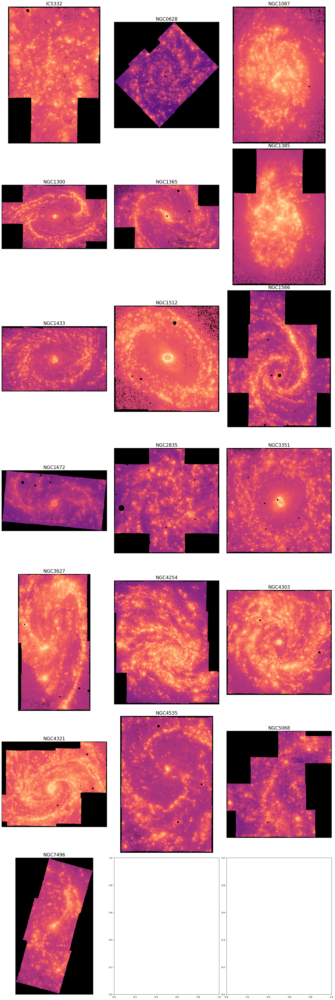

In [4]:
# set up plots & wcs information.
plots, wcss, hdus = [],[],[]
ext = "HA_FLUX_CORR"

for i in range(len(MUSEtable)):
    fileName = MUSEtable["maps_nat"][i]
    if os.path.isfile(fileName):
        MUSE_hdu = fits.open(fileName)
        hdus.append(MUSE_hdu)
        MUSE_map = MUSE_hdu[ext].data
        plots.append(MUSE_map)
        wcss.append(WCS(MUSE_hdu[ext].header, naxis=2))
    else:
        print("no file: ", fileName)

current_cmap = plt.get_cmap("magma")
current_cmap.set_bad("black")

# make multipanel plot of MUSE galaxies 
import math
i,j,m=0,0,0
PLOTS_PER_ROW = 3
fig, axs = plt.subplots(math.ceil(len(plots)/PLOTS_PER_ROW),PLOTS_PER_ROW, figsize=(20, 60))
for plot in plots:
    logplot = np.log10(plot)
    axs[i][j].imshow(logplot, cmap=current_cmap, aspect="equal", origin = "lower", interpolation = "nearest")
    axs[i][j].set_title(MUSEtable["Galaxy"][m].upper(), fontsize=20)
    axs[i][j].set_xticks([])
    axs[i][j].set_yticks([])
    j+=1
    if j%PLOTS_PER_ROW==0:
        i+=1
        j=0
    m+=1
plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1)
plt.show()
fig.savefig("../Figures/AllMUSEGalaxies.png", dpi=300)
plt.close()



INFO: 
                Inconsistent SIP distortion information is present in the FITS header and the WCS object:
                SIP coefficients were detected, but CTYPE is missing a "-SIP" suffix.
                astropy.wcs is using the SIP distortion coefficients,
                therefore the coordinates calculated here might be incorrect.

                If you do not want to apply the SIP distortion coefficients,
                please remove the SIP coefficients from the FITS header or the
                WCS object.  As an example, if the image is already distortion-corrected
                (e.g., drizzled) then distortion components should not apply and the SIP
                coefficients should be removed.

                While the SIP distortion coefficients are being applied here, if that was indeed the intent,
                for consistency please append "-SIP" to the CTYPE in the FITS header or the WCS object.

                 [astropy.wcs.wcs]
INFO: 
             

INFO: 
                Inconsistent SIP distortion information is present in the FITS header and the WCS object:
                SIP coefficients were detected, but CTYPE is missing a "-SIP" suffix.
                astropy.wcs is using the SIP distortion coefficients,
                therefore the coordinates calculated here might be incorrect.

                If you do not want to apply the SIP distortion coefficients,
                please remove the SIP coefficients from the FITS header or the
                WCS object.  As an example, if the image is already distortion-corrected
                (e.g., drizzled) then distortion components should not apply and the SIP
                coefficients should be removed.

                While the SIP distortion coefficients are being applied here, if that was indeed the intent,
                for consistency please append "-SIP" to the CTYPE in the FITS header or the WCS object.

                 [astropy.wcs.wcs]
INFO: 
             

/var/folders/db/q76d94y56zscb4zzdy5ffbm80000gn/T/ipykernel_14501/3836161619.py:23: RuntimeWarning: invalid value encountered in log10
  logplot = np.log10(plot)


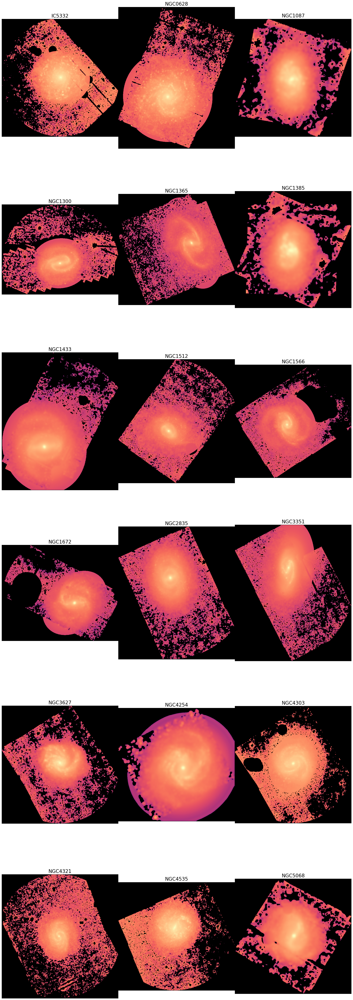

In [5]:
hdus,plots,wcss = [],[],[]

for i in range(len(MUSEtable)):
    fileName = MUSEtable["maps_irac"][i]
    if os.path.isfile(fileName):
        IRAC_hdu = fits.open(fileName)
        hdus.append(IRAC_hdu)
        IRAC_map = IRAC_hdu[0].data
        plots.append(IRAC_map)
        wcss.append(WCS(IRAC_hdu[0].header, naxis=2))
    else:
        print("no file: ", fileName)

current_cmap = plt.get_cmap("magma")
current_cmap.set_bad("black")

# make multipanel plot of MUSE galaxies 
import math
i,j,m=0,0,0
PLOTS_PER_ROW = 3
fig, axs = plt.subplots(math.ceil(len(plots)/PLOTS_PER_ROW),PLOTS_PER_ROW, figsize=(20, 60))
for plot in plots:
    logplot = np.log10(plot)
    axs[i][j].imshow(logplot, cmap=current_cmap, aspect="equal", origin = "lower", interpolation = "nearest")
    axs[i][j].set_title(MUSEtable["Galaxy"][m].upper(), fontsize=20)
    axs[i][j].set_xticks([])
    axs[i][j].set_yticks([])
    j+=1
    if j%PLOTS_PER_ROW==0:
        i+=1
        j=0
    m+=1
plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1)
plt.show()
fig.savefig("../Figures/AllIRACGalaxies.png", dpi=300)
plt.close()
